#Preparación del entorno


In [ ]:
%%capture
!pip install -q pixellib torchvision timm
!pip install -q ultralytics==8.0.196

In [ ]:
import pixellib
from pixellib.torchbackend.instance import instanceSegmentation

from IPython.display import Image as Image2
from IPython.display import display

from PIL import ImageDraw, ImageFont, Image

import torch
import matplotlib.pyplot as plt
from torchvision import transforms
import ultralytics
from ultralytics import YOLO
import numpy as np
import io
import requests
import itertools
import seaborn as sns
from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id
import timm
import zipfile
import os
import cv2
import random

#display.clear_output()
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.5/78.2 GB disk)


In [ ]:
%%capture
!wget https://github.com/ayoolaolafenwa/PixelLib/releases/download/0.2.0/pointrend_resnet50.pkl -O pointrend_resnet50.pkl
!wget http://download.tensorflow.org/models/object_detection/mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar zxvf mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mscoco_labels.names -O mscoco_labels.names
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/colors.txt -O colors.txt
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt -O mask_rcnn_inception_v2_coco_2018_01_28.pbtxt
!mkdir /content/img_resnet
!gdown --id $'1TFcbTu0detVxWs5uJLOcUGZZagaV69Gc'
!mkdir /content/imagenes
!mkdir /content/escaladas

In [ ]:
with zipfile.ZipFile('Ejercicio_9.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/imagenes/')

def escalar_imagenes(carpeta_origen, carpeta_destino, relacion):
  if not os.path.exists(carpeta_destino):
    os.makedirs(carpeta_destino)

  archivos = os.listdir(carpeta_origen)

  for archivo in archivos:
    ruta_origen = os.path.join(carpeta_origen, archivo)
    ruta_destino = os.path.join(carpeta_destino, archivo)

    img = cv2.imread(ruta_origen, cv2.IMREAD_UNCHANGED)

    width = int(img.shape[1] * relacion)
    height = int(img.shape[0] * relacion)
    dim = (width, height)

    resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
    cv2.imwrite(ruta_destino, resized)

escalar_imagenes('./imagenes', './escaladas', 0.2)

#Funciones de procesamiento por lotes


In [ ]:
def procesar_imagenes(carpeta, funcion_procesamiento):

  imagenes = os.listdir(carpeta)

  rutas_imagenes =[os.path.join(carpeta, imagen) for imagen in imagenes]

  for image_path in rutas_imagenes:
    image = cv2.imread(image_path)

    output_image = None

    output_image = funcion_procesamiento(image)

    if output_image is not None:
      plt.figure(figsize=(12, 6))
      plt.subplot(1, 2, 1)
      plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      plt.title('Imagen Original')
      plt.axis('off')

      plt.subplot(1, 2, 2)
      plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
      plt.title('Imagen Segmentada')
      plt.axis('off')


# Instance Segmentation con Mask R-CNN (OpenCV)

Carga y configuracion del modelo

In [ ]:
clases_rccn = None
with open("mscoco_labels.names", 'rt') as f:
    clases_rccn = f.read().rstrip('\n').split('\n')

colors = []
with open("colors.txt", 'rt') as f:
    colorsStr = f.read().rstrip('\n').split('\n')
    for i in range(len(colorsStr)):
        rgb = colorsStr[i].split(' ')
        color = np.array([float(rgb[0]), float(rgb[1]), float(rgb[2])])
        colors.append(color)

textGraph = "./mask_rcnn_inception_v2_coco_2018_01_28.pbtxt"
modelWeights = "./mask_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb"

model_kccn = cv2.dnn.readNetFromTensorflow(modelWeights, textGraph)
model_kccn.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
model_kccn.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [ ]:
def r_ccn(imagen):
  (H, W) = imagen.shape[:2]

  blob = cv2.dnn.blobFromImage(imagen, swapRB=True, crop=False)
  model_kccn.setInput(blob)

  (boxes, masks) = model_kccn.forward(["detection_out_final", "detection_masks"])

  for i in range(0, boxes.shape[2]):
    confidence = boxes[0, 0, i, 2]

    if confidence < 0.5:
      continue

    classId = int(boxes[0, 0, i, 1])
    className = clases_rccn[classId]

    if not className in ['banana', 'apple']:
      continue

    box = boxes[0, 0, i, 3:7] * np.array([W, H, W, H])
    (startX, startY, endX, endY) = box.astype("int")

    mask = masks[i, classId]
    mask = cv2.resize(mask, (endX - startX, endY - startY))
    mask = (mask > 0.3).astype("uint8")

    roi = imagen[startY:endY, startX:endX]

    color = random.choice(colors)
    color_mask = np.zeros_like(roi)
    color_mask[mask == 1] = color

    roi = cv2.addWeighted(roi, 1, color_mask, 0.4, 0)

    imagen[startY:endY, startX:endX] = roi

    cv2.rectangle(imagen, (startX, startY), (endX, endY), color, 4)

    label = f"{className}: {confidence:.2f}"
    cv2.rectangle(imagen, (startX, startY), (endX, endY), color, 4)
    cv2.putText(imagen, label, (startX, startY - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  return imagen

Visualización

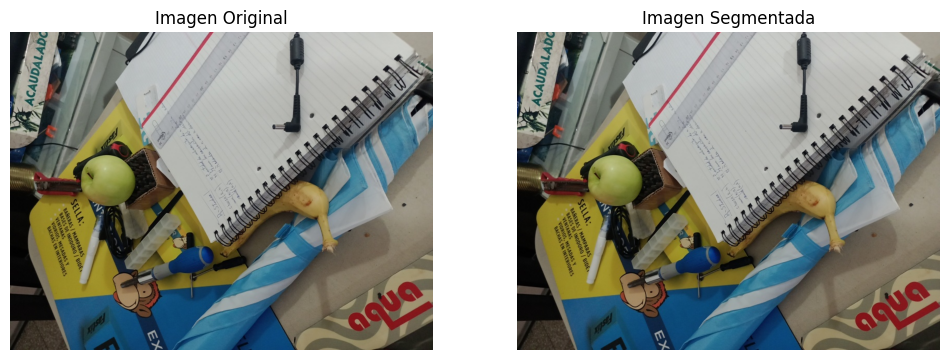

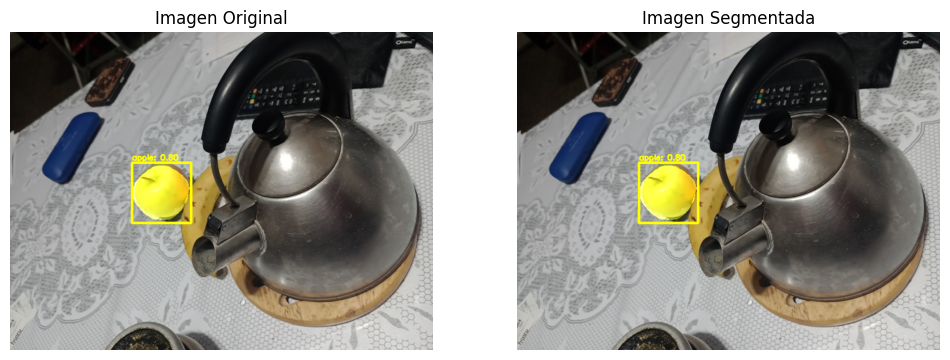

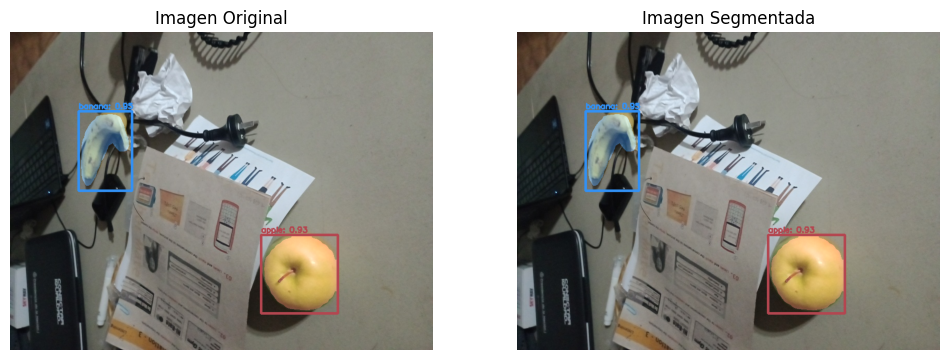

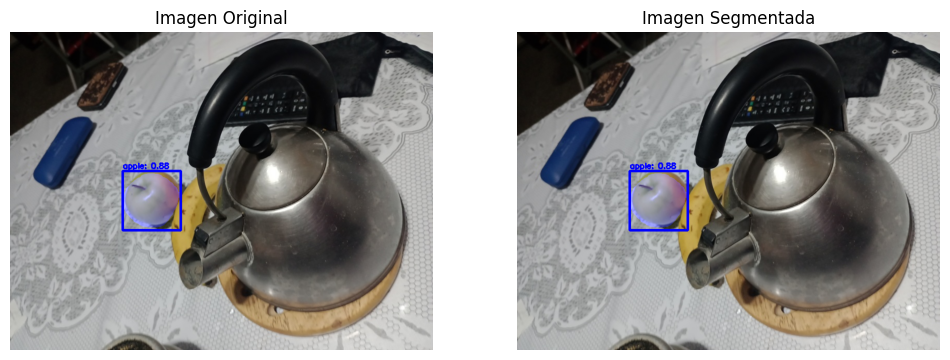

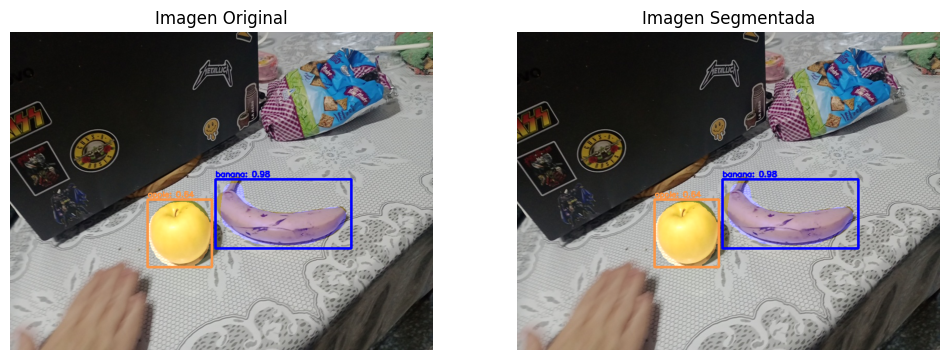

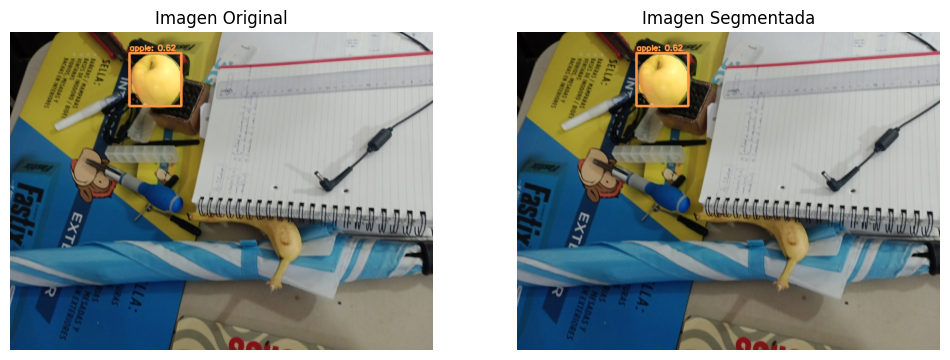

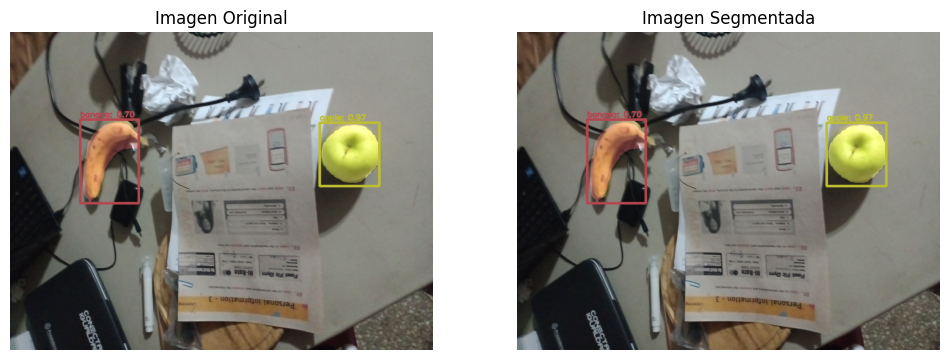

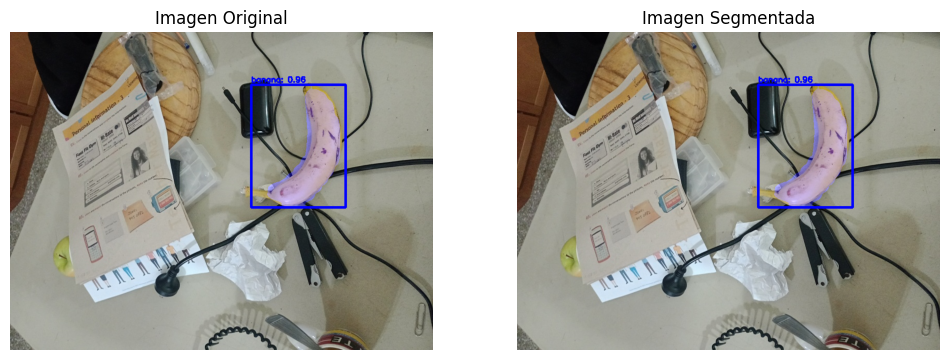

In [ ]:
procesar_imagenes('./escaladas', r_ccn)

# Instance Segmentation con modelo PointRend Resnet50 (PixelLib)

Preparacion del modelo

In [ ]:
model_resnet = instanceSegmentation()
model_resnet.load_model("pointrend_resnet50.pkl")

def Resnet(carpeta_in):
  imagenes = os.listdir(carpeta_in)

  rutas_imagenes =[os.path.join(carpeta_in, imagen) for imagen in imagenes]

  for n, image_path in enumerate(rutas_imagenes):
    ruta_completa = "/content/img_resnet/" + imagenes[n]

    model_resnet.segmentImage(image_path, show_bboxes=True, output_image_name=ruta_completa)

    display(Image(filename=ruta_completa))


Visualizacion

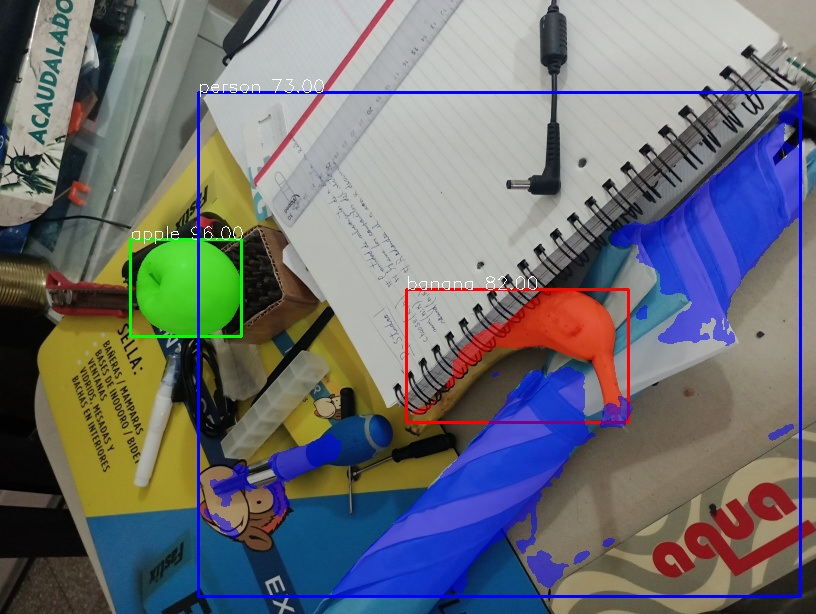

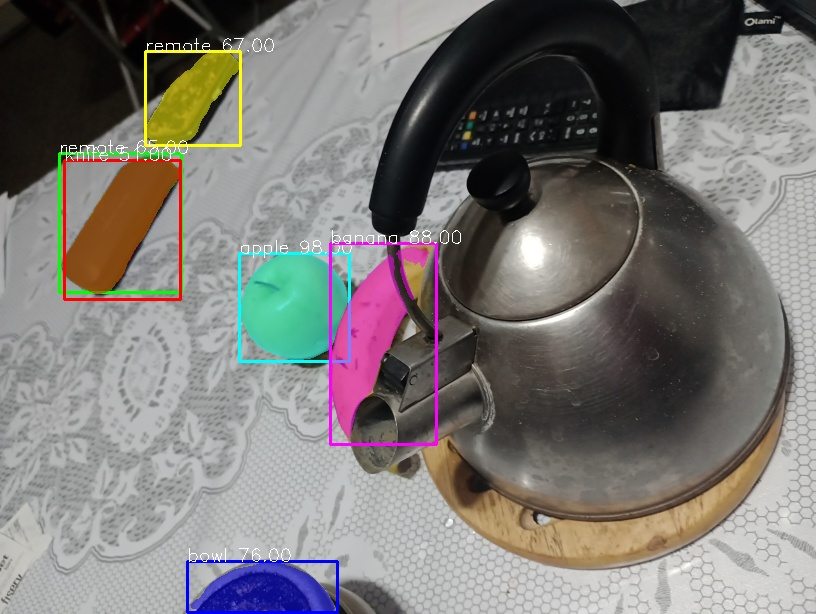

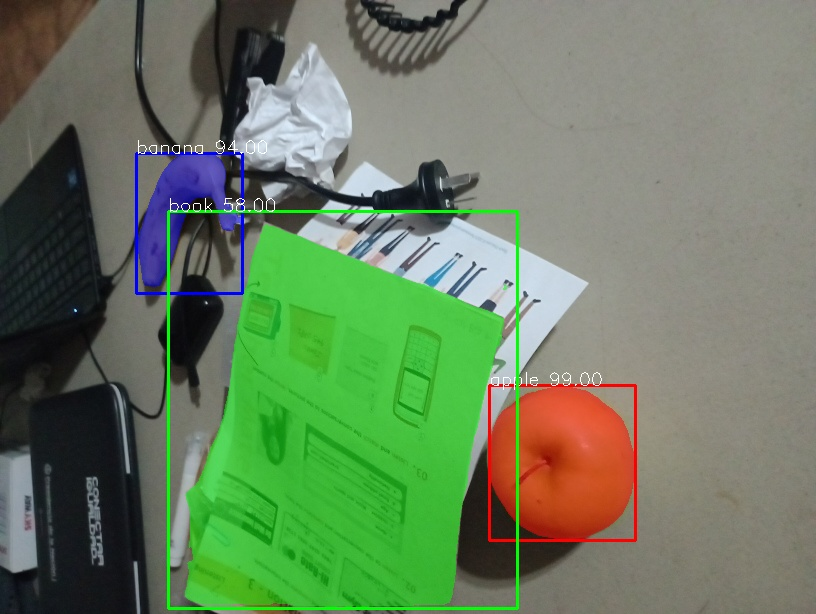

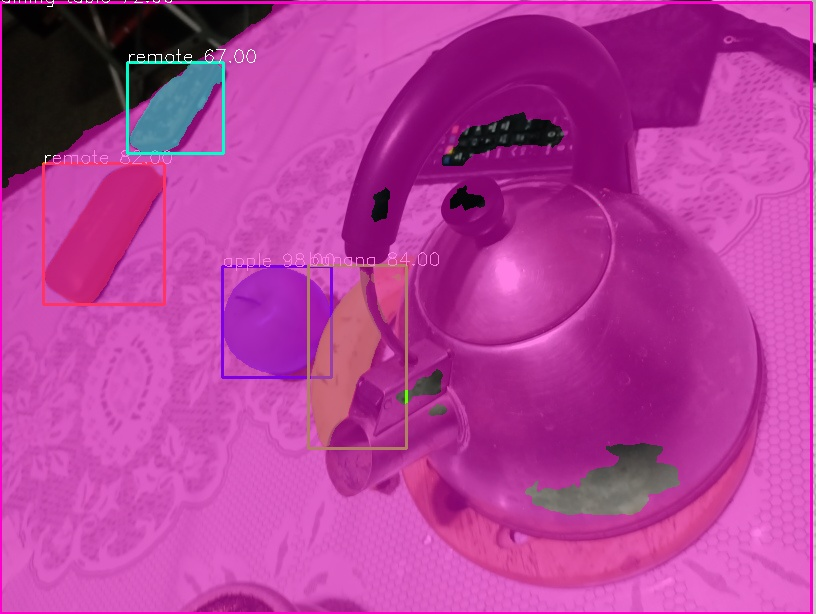

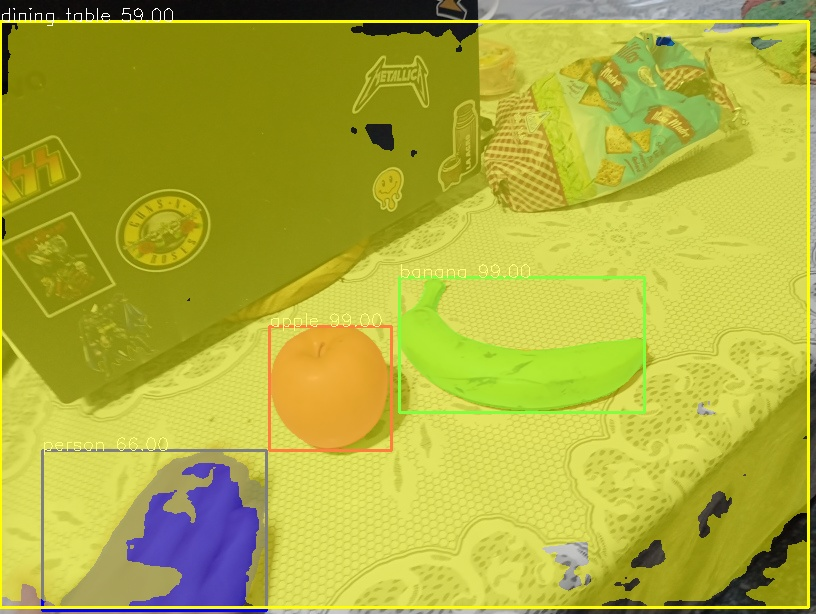

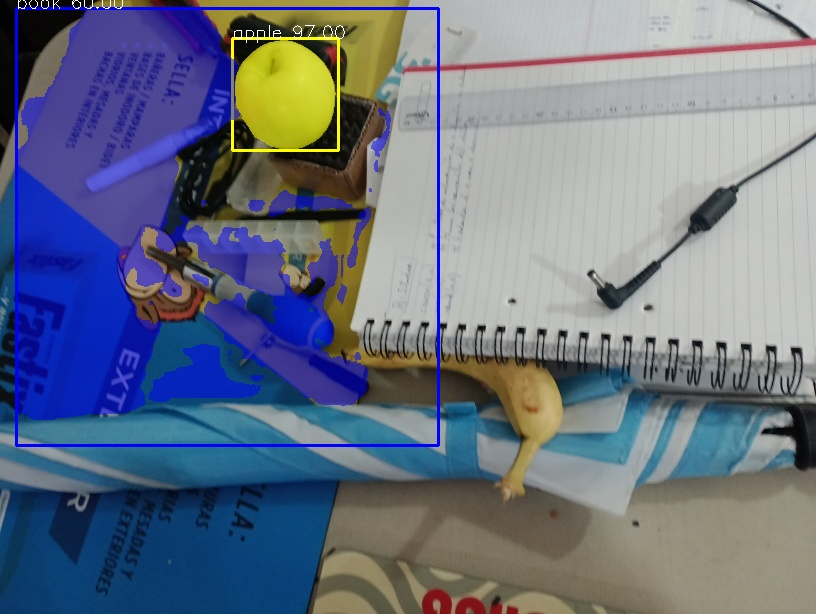

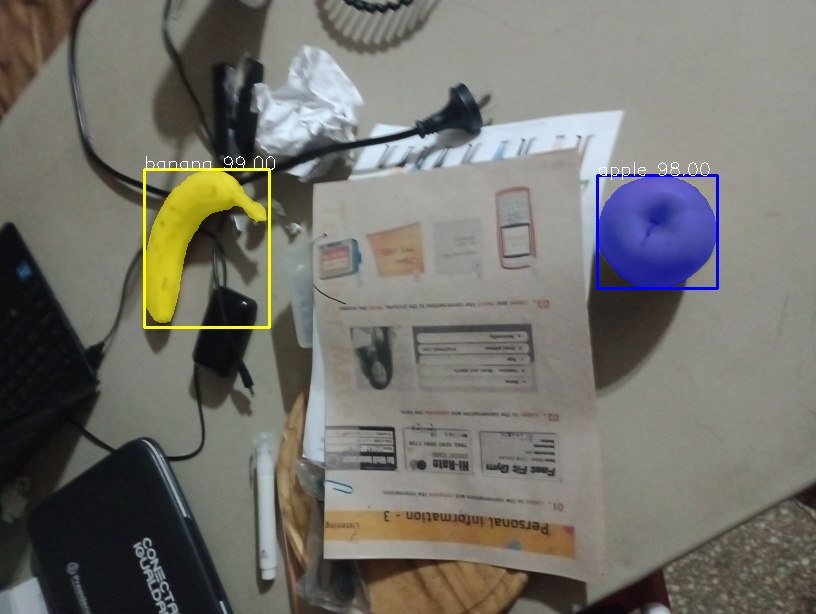

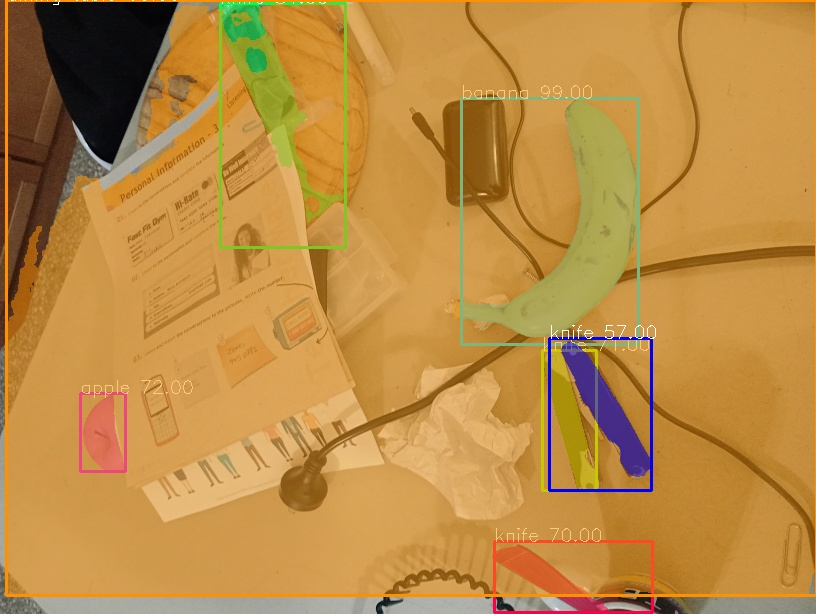

In [ ]:
Resnet("/content/escaladas")

# Semantic Segmentation con modelo DeepLabV3 (Torchvision)

Preparacion del modelo

In [ ]:
model_torch = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model_torch.eval()

preprocess_deeplab = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def deeplab(image):
  input_tensor = preprocess_deeplab(image)
  input_batch = input_tensor.unsqueeze(0)

  if torch.cuda.is_available():
      input_batch = input_batch.to('cuda')
      model_torch.to('cuda')

  with torch.no_grad():
      output = model_torch(input_batch)['out'][0]

  output_predictions = output.argmax(0)

  palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
  colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
  colors = (colors % 255).numpy().astype("uint8")

  H, W = image.shape[:2]

  r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize((W,H))
  r.putpalette(colors)

  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title('Imagen Original')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(r)
  plt.title('Imagen Segmentada')
  plt.axis('off')

  plt.show()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Visualizacion

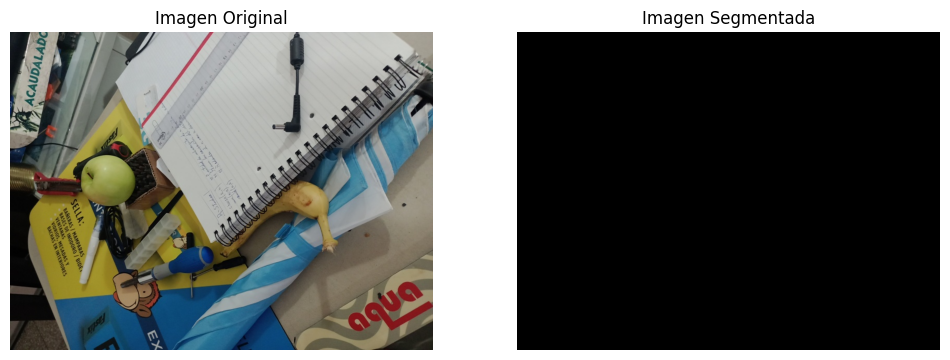

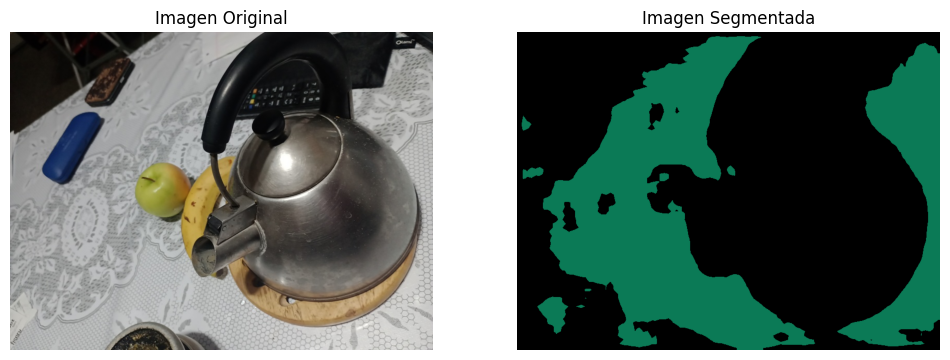

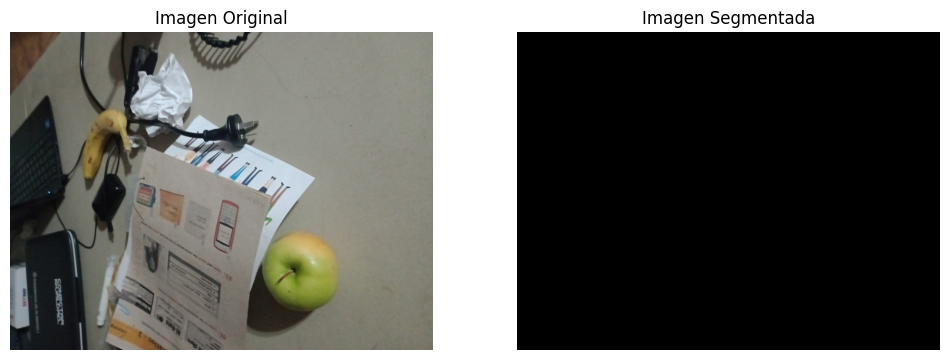

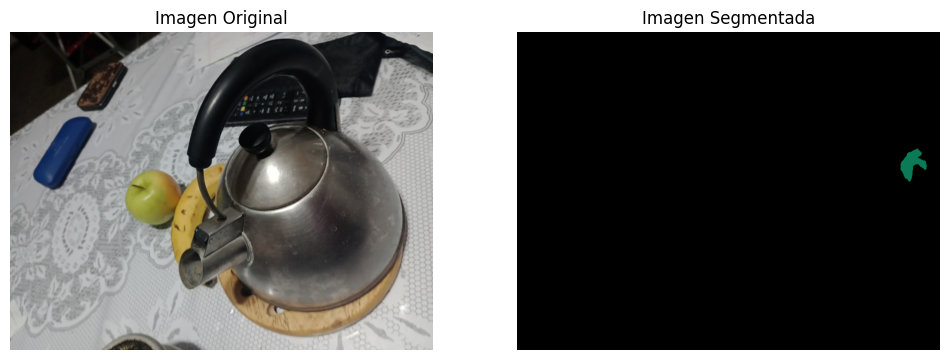

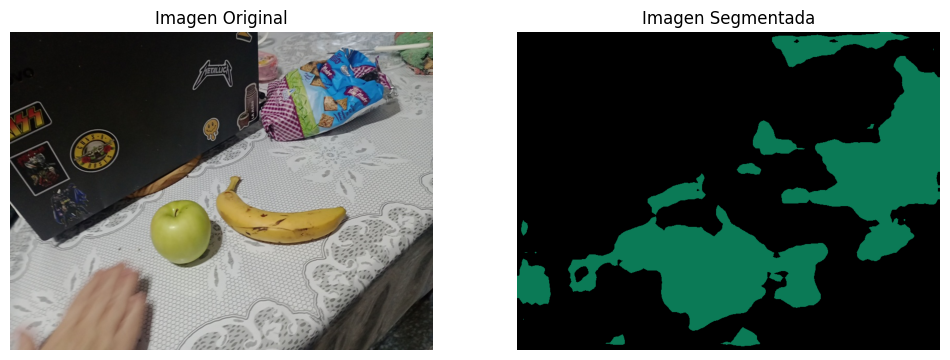

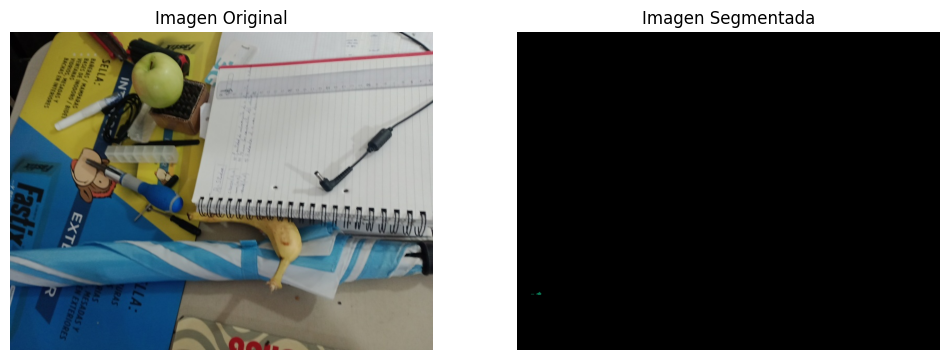

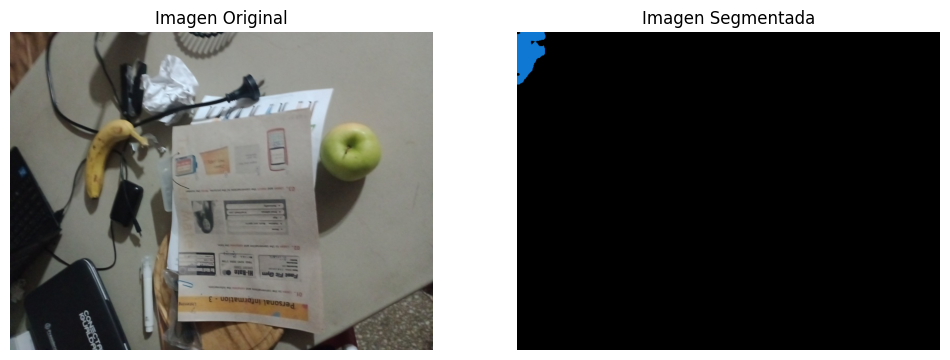

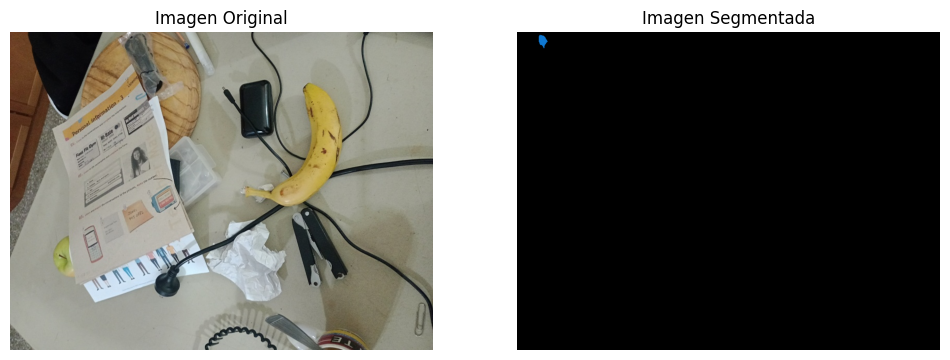

In [ ]:
procesar_imagenes("./escaladas", deeplab)

# Instance Segmentation con YoloV8 (Ultralytics)

Preparación del modelo

In [ ]:
model_yolo = YOLO("yolov8m-seg.pt")

def yolo(carpeta_in):
  imagenes = os.listdir(carpeta_in)

  rutas_imagenes =[os.path.join(carpeta_in, imagen) for imagen in imagenes]

  for n, image_path in enumerate(rutas_imagenes):
    results = model_yolo.predict(image_path)
    result = results[0]

    img = Image.open(image_path)
    draw = ImageDraw.Draw(img)

    for box in results[0].boxes:
      x1, y1, x2, y2, conf, cls = box.data[0]
      label = result.names[int(cls)]

      if not label in ['banana', 'apple']:
        continue

      draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=4)

      text = f"{label} {conf:.2f}"
      draw.text((x1, y1-10), text, fill=(0, 255, 0))

    masks = result.masks

    for mask in masks:
      mask_data = mask.data[0].cpu().numpy()
      polygon = mask.xy[0]

      polygon_list = [(p[0], p[1]) for p in polygon]
      draw.polygon(polygon_list, outline=(255, 0, 0), width=3)

    display(img)

Visualizacion


image 1/1 /content/escaladas/IMG_20240417_080327361.jpg: 512x640 1 sports ball, 1 banana, 35.6ms
Speed: 3.1ms preprocess, 35.6ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 640)


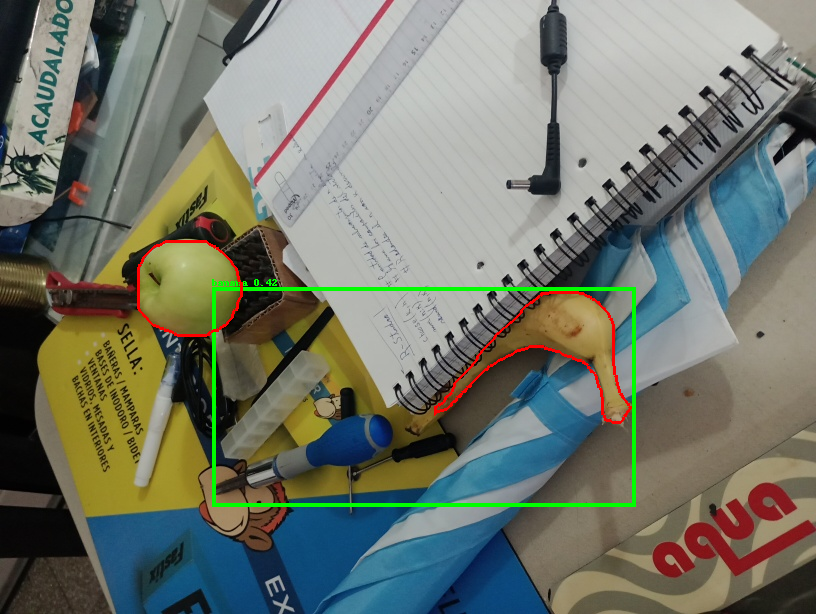


image 1/1 /content/escaladas/IMG_20240417_080242078.jpg: 512x640 1 knife, 1 banana, 1 apple, 1 dining table, 1 remote, 34.8ms
Speed: 3.6ms preprocess, 34.8ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 640)


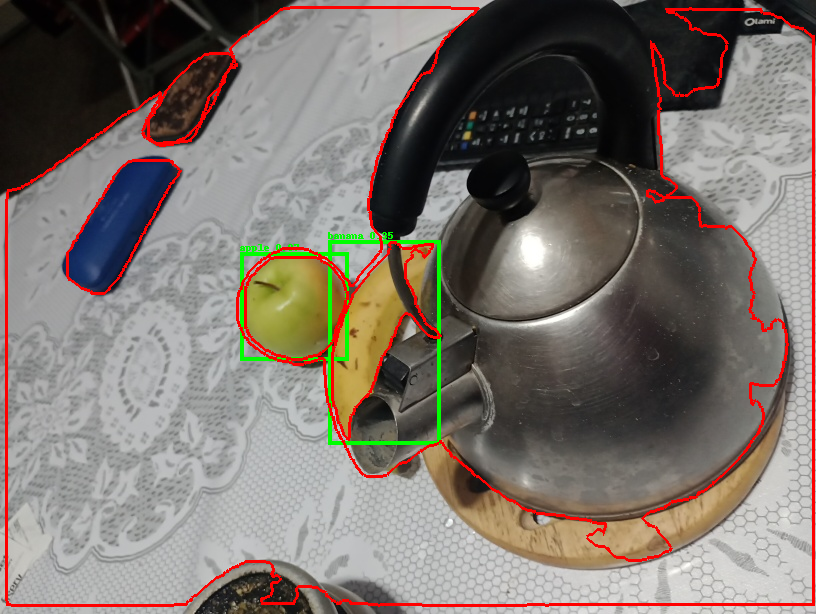


image 1/1 /content/escaladas/IMG_20240417_080258290.jpg: 512x640 1 banana, 1 apple, 1 laptop, 1 book, 34.8ms
Speed: 3.6ms preprocess, 34.8ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 640)


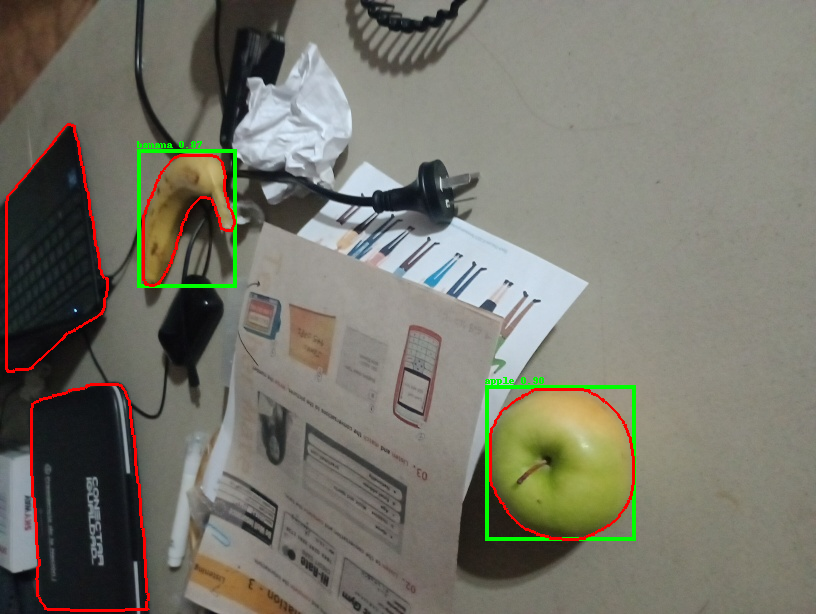


image 1/1 /content/escaladas/IMG_20240417_080238967.jpg: 512x640 1 cup, 1 knife, 1 banana, 1 apple, 1 dining table, 1 remote, 34.8ms
Speed: 3.0ms preprocess, 34.8ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)


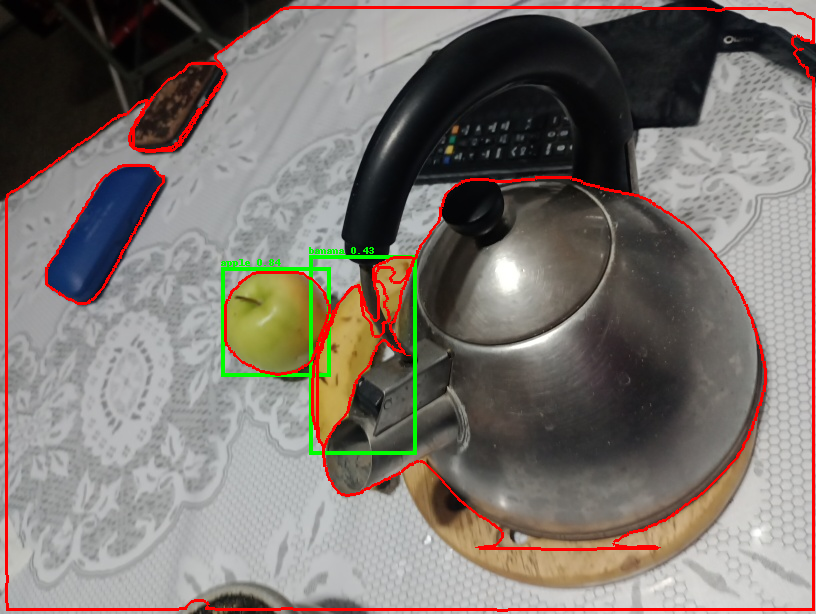


image 1/1 /content/escaladas/IMG_20240417_080231198.jpg: 512x640 1 person, 1 banana, 1 apple, 1 dining table, 1 laptop, 34.8ms
Speed: 3.3ms preprocess, 34.8ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 640)


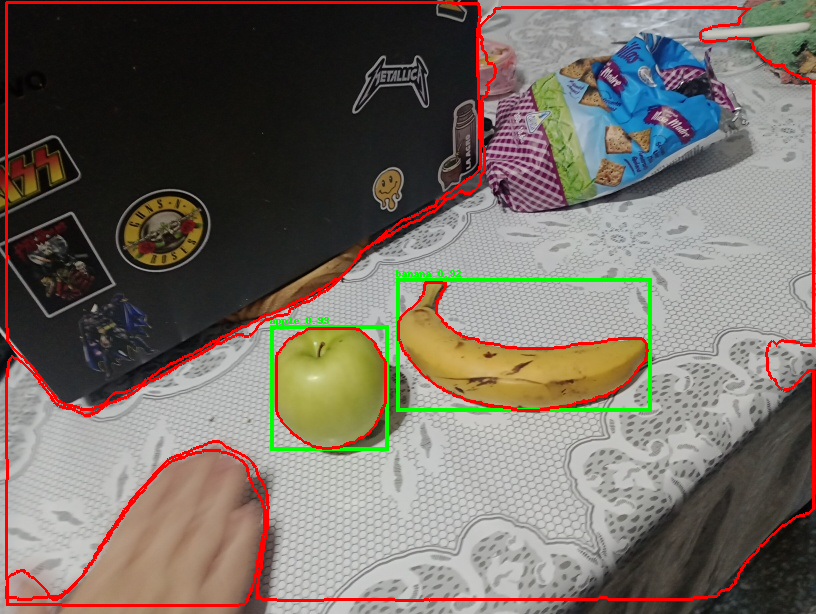


image 1/1 /content/escaladas/IMG_20240417_080330790.jpg: 512x640 1 apple, 34.8ms
Speed: 4.0ms preprocess, 34.8ms inference, 2.9ms postprocess per image at shape (1, 3, 512, 640)


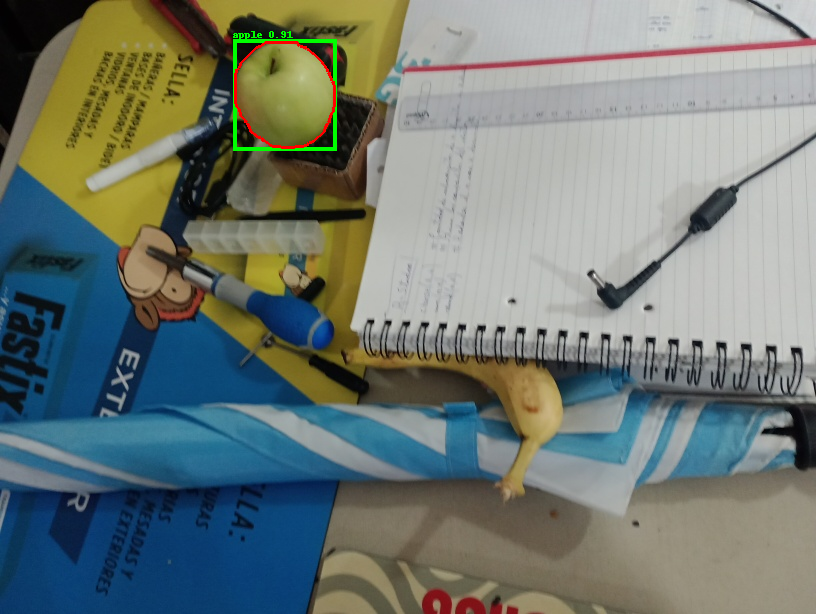


image 1/1 /content/escaladas/IMG_20240417_080255142.jpg: 512x640 1 banana, 1 apple, 1 laptop, 34.8ms
Speed: 3.7ms preprocess, 34.8ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)


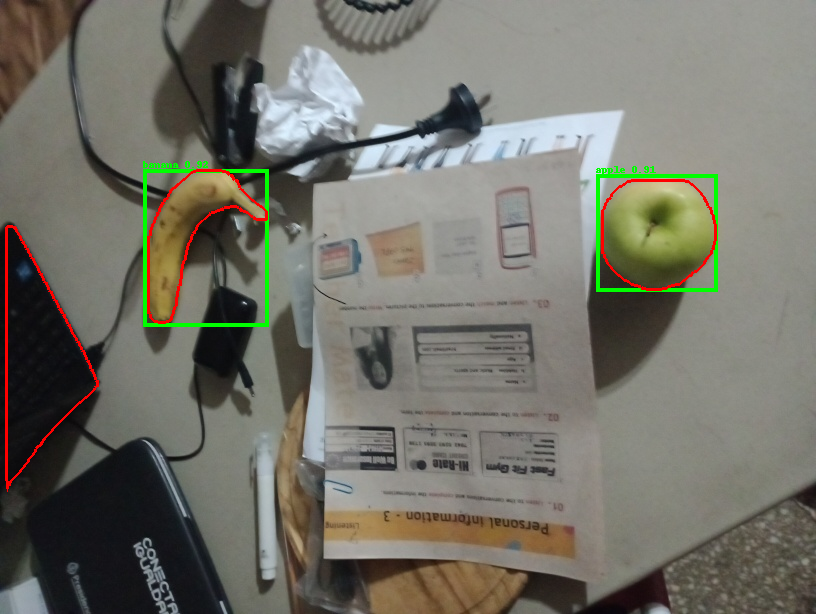


image 1/1 /content/escaladas/IMG_20240417_080308938.jpg: 512x640 1 fork, 1 knife, 1 banana, 1 apple, 34.8ms
Speed: 3.4ms preprocess, 34.8ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 640)


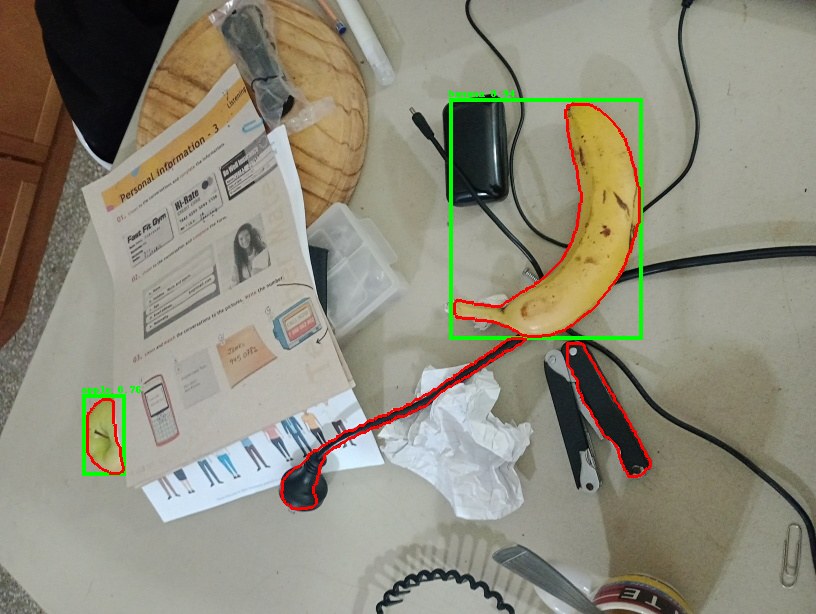

In [ ]:
yolo('/content/escaladas')

# Panoptic segmentation con modelo DETR ResNet50 (Transformers)

Preparacion del modelo

In [ ]:
detr_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
detr_model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/289 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/detr/feature_extraction_detr.py:38: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/172M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
def detr(image):
  inputs = detr_extractor(images=image, return_tensors="pt")

  outputs = detr_model(**inputs)

  processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
  result = detr_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.85)[0]

  panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
  panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
  panoptic_seg_id = rgb_to_id(panoptic_seg)

  palette = itertools.cycle(sns.color_palette())

  segmented_image = Image.fromarray(np.zeros_like(panoptic_seg, dtype=np.uint8))
  draw = ImageDraw.Draw(segmented_image)

  COCO_LABELS = {52: 'banana', 53: 'manzana'}

  for segment_info in result["segments_info"]:
    class_id = segment_info["category_id"]
    class_name = COCO_LABELS.get(class_id, 'Desconocido')

    if class_name == 'Desconocido':
      continue

    id = segment_info["id"]

    mask = panoptic_seg_id == id
    color = np.array(next(palette)) * 255

    mask_image = Image.fromarray((mask * 255).astype(np.uint8))

    color_image = Image.new("RGB", segmented_image.size, color=tuple(color.astype(int)))

    segmented_image.paste(color_image, (0,0), mask=mask_image)

    draw = ImageDraw.Draw(segmented_image)
    where = np.where(mask)

    if where[0].size > 0 and where[1].size > 0:
      x, y = np.min(where[1]), np.min(where[0])
      draw.text((x, y), class_name, fill='white')

  return cv2.cvtColor(np.array(segmented_image), cv2.COLOR_RGB2BGR)

Visualizacion

`post_process_panoptic is deprecated and will be removed in v5 of Transformers, please use `post_process_panoptic_segmentation`.
/usr/local/lib/python3.10/dist-packages/transformers/models/detr/image_processing_detr.py:1652: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  np_seg_img = torch.ByteTensor(torch.ByteStorage.from_buffer(seg_img.tobytes()))
/usr/local/lib/python3.10/dist-packages/transformers/models/detr/feature_extraction_detr.py:28: FutureWarning: rgb_to_id has moved and will not be importable from this module from v5. Please import from transformers.image_transforms instead.
  warnings.warn(


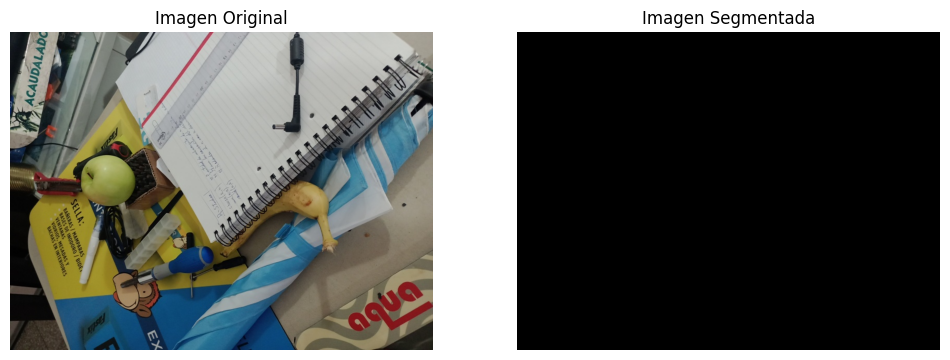

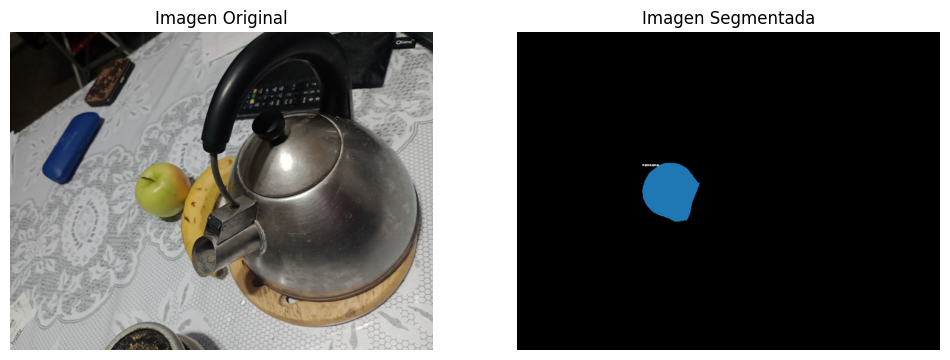

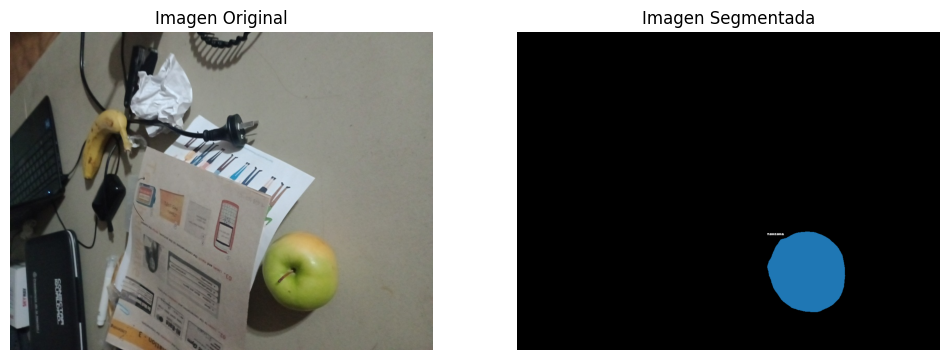

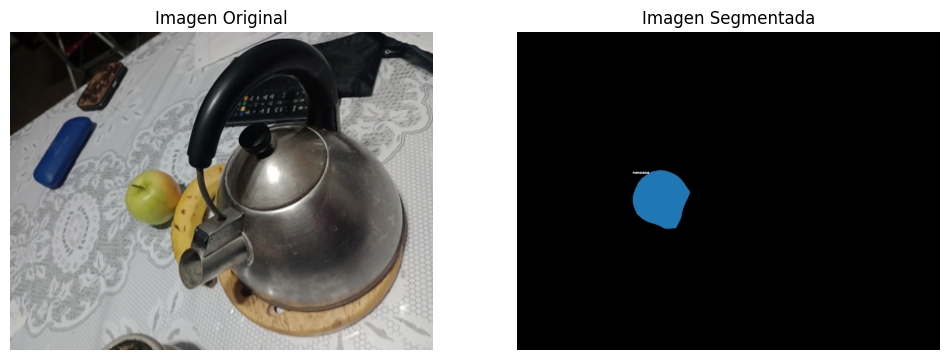

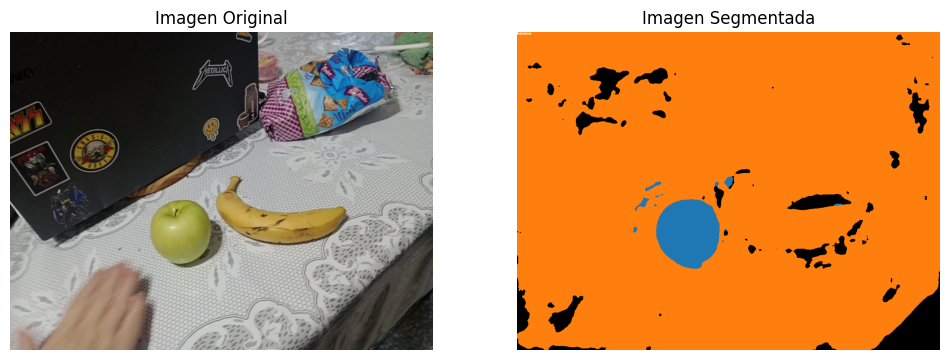

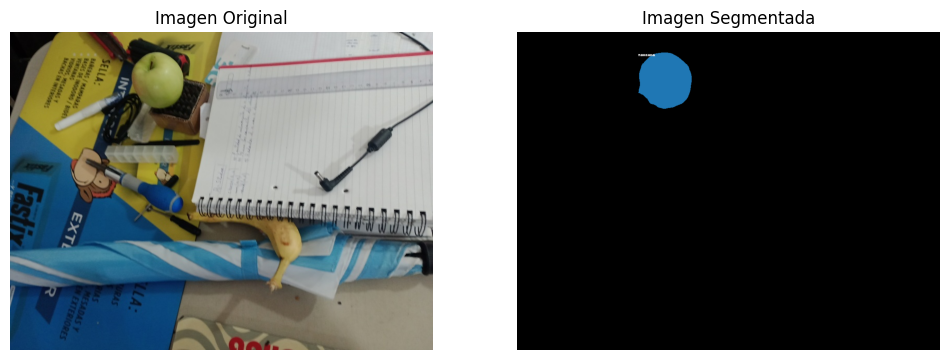

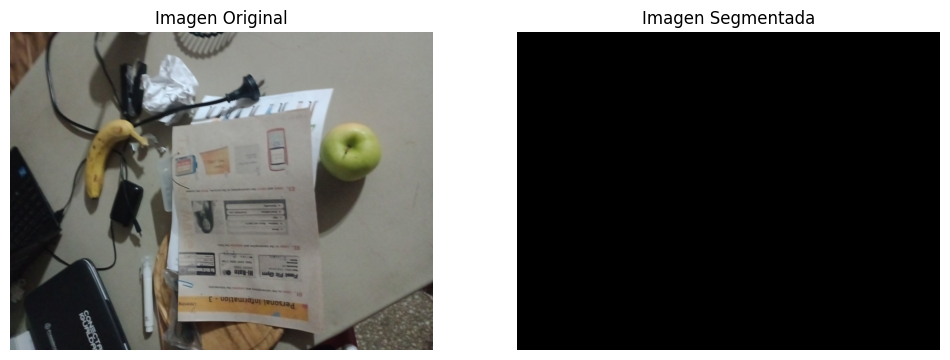

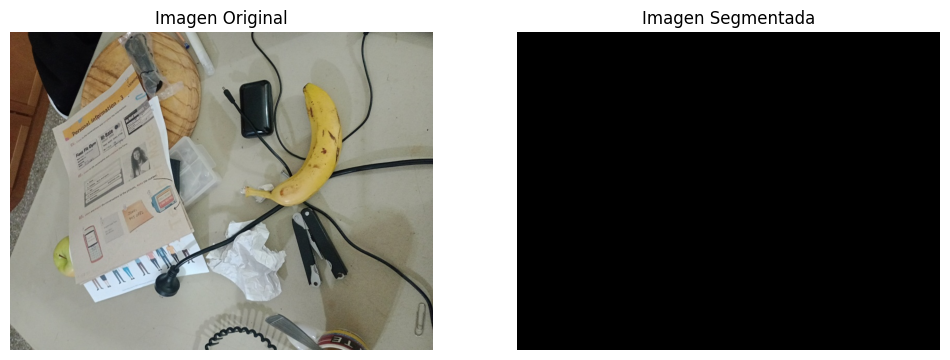

In [ ]:
procesar_imagenes("./escaladas/", detr)

#Conclusion

Los modelos por su tiempo de ejecucion como estan configurados actualmente no permitirian realizar reconocimiento de imagenes en tiempo real. A su vez estos tienen un bajo performance en reconocer objetos cotidianos, poseen dificultad a la hora de reconocer la manzana verde o la banana cubierta parcialmente.

Los modelos que mejor funcionaron en esta actividad fueron Resnet50 de PixelLib y YoloV8  de Ultralytics.

En el caso de replicar la problemática recomendaría utilizar algun modelo mas enfocado en el reconocimiento de frutas.